## Import dependencies

In [23]:
import findspark
import keras_tuner as kt
from pathlib import Path
import pyspark
from pyspark.sql import SparkSession
import pandas as pd
from sklearn import tree
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier
%matplotlib inline
from sklearn.datasets import load_iris
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans, AgglomerativeClustering, Birch
import hvplot.pandas
import tensorflow as tf

Using TensorFlow backend


## Initialize SparkSession and load csv

In [3]:
findspark.init()
spark = SparkSession.builder.appName("Diabetes Dataframe").getOrCreate()

file_path = "C:\\Users\leahl\Documents\Vanderbilt_Bootcamp\Challenges\GitHub_local\diabetes_prediction\Resources\diabetes_indicators_clean.csv"
# REFERENCED SPARK.APACHE.ORG/DOCS/LATEST/SQL-DATA-SOURCES-LOAD-SAVE-FUNCTIONS.HTML
spark_df = spark.read.load(file_path, format="csv", sep=",", inferSchema="true", header="true")

spark_df.show(10)

+------------+------+--------+---------+---+------+------+--------------------+------------+------+-------+-----------------+-------------+-----------+-------+--------+--------+--------+---+---+---------+------+
|Diabetes_012|HighBP|HighChol|CholCheck|BMI|Smoker|Stroke|HeartDiseaseorAttack|PhysActivity|Fruits|Veggies|HvyAlcoholConsump|AnyHealthcare|NoDocbcCost|GenHlth|MentHlth|PhysHlth|DiffWalk|Sex|Age|Education|Income|
+------------+------+--------+---------+---+------+------+--------------------+------------+------+-------+-----------------+-------------+-----------+-------+--------+--------+--------+---+---+---------+------+
|           0|     1|       1|        1| 40|     1|     0|                   0|           0|     0|      1|                0|            1|          0|      5|      18|      15|       1|  0|  9|        4|     3|
|           0|     0|       0|        0| 25|     1|     0|                   0|           1|     0|      0|                0|            0|          1| 

In [5]:
spark_df.describe().show()

+-------+-------------------+-------------------+------------------+-------------------+-----------------+-------------------+-------------------+--------------------+------------------+------------------+------------------+--------------------+-------------------+------------------+------------------+-----------------+-----------------+------------------+------------------+-----------------+------------------+------------------+
|summary|       Diabetes_012|             HighBP|          HighChol|          CholCheck|              BMI|             Smoker|             Stroke|HeartDiseaseorAttack|      PhysActivity|            Fruits|           Veggies|   HvyAlcoholConsump|      AnyHealthcare|       NoDocbcCost|           GenHlth|         MentHlth|         PhysHlth|          DiffWalk|               Sex|              Age|         Education|            Income|
+-------+-------------------+-------------------+------------------+-------------------+-----------------+-------------------+------

In [4]:
# CONVERT SPARK DATAFRAME TO PANDAS
di_df = spark_df.toPandas()
di_df.head()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0,1,1,1,40,1,0,0,0,0,...,1,0,5,18,15,1,0,9,4,3
1,0,0,0,0,25,1,0,0,1,0,...,0,1,3,0,0,0,0,7,6,1
2,0,1,1,1,28,0,0,0,0,1,...,1,1,5,30,30,1,0,9,4,8
3,0,1,0,1,27,0,0,0,1,1,...,1,0,2,0,0,0,0,11,3,6
4,0,1,1,1,24,0,0,0,1,1,...,1,0,2,3,0,0,0,11,5,4


## NN_MODEL_1 - baseline
### Pulled from the original dataset to see accuracy before any optimization

In [8]:
# READ IN ORIGINAL FILE FOR BASELINE ANALYSIS
original_file = pd.read_csv(Path("Resources/diabetes_indicators.csv"), encoding="UTF-8")

In [9]:
# Remove Diabetes_012 target from features data on original data set
y = original_file.Diabetes_012.values.reshape(-1, 1)
X = original_file.drop(columns=["Diabetes_012"]).values

# Split training/test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, stratify=y)

In [10]:
 #Preprocess numerical data for neural network

# Create a StandardScaler instances
scaler = StandardScaler()

# Fit the StandardScaler
X_scaler = scaler.fit(X_train)

# Scale the data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [11]:
nn_model = tf.keras.models.Sequential()
nn_model.add(tf.keras.layers.Dense(units=16, activation="relu", input_dim=21))
nn_model.add(tf.keras.layers.Dense(units=16, activation="relu"))
nn_model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

# Compile the Sequential model together and customize metrics
nn_model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

# Train the model
fit_model = nn_model.fit(X_train_scaled, y_train, epochs=50)

Epoch 1/50
5946/5946 [==============================] - 6s 966us/step - loss: 0.3449 - accuracy: 0.7181
Epoch 2/50
5946/5946 [==============================] - 6s 976us/step - loss: 0.0728 - accuracy: 0.7305
Epoch 3/50
5946/5946 [==============================] - 6s 953us/step - loss: -0.9985 - accuracy: 0.7299
Epoch 4/50
5946/5946 [==============================] - 6s 960us/step - loss: -3.5215 - accuracy: 0.7303
Epoch 5/50
5946/5946 [==============================] - 6s 940us/step - loss: -8.2039 - accuracy: 0.7282
Epoch 6/50
5946/5946 [==============================] - 6s 949us/step - loss: -15.9607 - accuracy: 0.7261
Epoch 7/50
5946/5946 [==============================] - 6s 955us/step - loss: -27.0163 - accuracy: 0.7229
Epoch 8/50
5946/5946 [==============================] - 6s 953us/step - loss: -42.2435 - accuracy: 0.7221
Epoch 9/50
5946/5946 [==============================] - 6s 966us/step - loss: -62.5399 - accuracy: 0.7210
Epoch 10/50
5946/5946 [==============================

In [12]:
# Evaluate the model using the test data
model_loss, model_accuracy = nn_model.evaluate(X_test_scaled,y_test,verbose=2)
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

1982/1982 - 1s - loss: -1.2641e+04 - accuracy: 0.7110 - 1s/epoch - 718us/step
Loss: -12641.369140625, Accuracy: 0.7110059857368469


### NN_MODEL_1 - baseline results : `Accuracy 71.1%`

__________________________________________________________________________________________

## NN_MODEL_2 with reduced features
### removed `NoDocbcCost` column to see if it increased accuracy

In [13]:
# Remove Diabetes_012 target from features data on original data set
y = original_file.Diabetes_012.values.reshape(-1, 1)
X = original_file.drop(columns=["Diabetes_012","NoDocbcCost"]).values

# Split training/test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, stratify=y)

In [14]:
 #Preprocess numerical data for neural network

# Create a StandardScaler instances
scaler = StandardScaler()

# Fit the StandardScaler
X_scaler = scaler.fit(X_train)

# Scale the data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [15]:
nn_model = tf.keras.models.Sequential()
nn_model.add(tf.keras.layers.Dense(units=16, activation="relu", input_dim=20))
nn_model.add(tf.keras.layers.Dense(units=16, activation="relu"))
nn_model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

# Compile the Sequential model together and customize metrics
nn_model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

# Train the model
fit_model = nn_model.fit(X_train_scaled, y_train, epochs=25)

Epoch 1/25
5946/5946 [==============================] - 7s 1ms/step - loss: 0.3548 - accuracy: 0.7075
Epoch 2/25
5946/5946 [==============================] - 7s 1ms/step - loss: 0.1981 - accuracy: 0.7245
Epoch 3/25
5946/5946 [==============================] - 7s 1ms/step - loss: -0.5888 - accuracy: 0.7332
Epoch 4/25
5946/5946 [==============================] - 7s 1ms/step - loss: -2.7724 - accuracy: 0.7328
Epoch 5/25
5946/5946 [==============================] - 7s 1ms/step - loss: -7.1564 - accuracy: 0.7404
Epoch 6/25
5946/5946 [==============================] - 7s 1ms/step - loss: -14.4641 - accuracy: 0.7318
Epoch 7/25
5946/5946 [==============================] - 7s 1ms/step - loss: -25.7137 - accuracy: 0.7214
Epoch 8/25
5946/5946 [==============================] - 6s 1ms/step - loss: -41.5591 - accuracy: 0.7253
Epoch 9/25
5946/5946 [==============================] - 7s 1ms/step - loss: -63.1030 - accuracy: 0.7241
Epoch 10/25
5946/5946 [==============================] - 7s 1ms/step - 

In [16]:
# Evaluate the model using the test data
model_loss, model_accuracy = nn_model.evaluate(X_test_scaled,y_test,verbose=2)
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

1982/1982 - 1s - loss: -1.6097e+03 - accuracy: 0.7135 - 1s/epoch - 722us/step
Loss: -1609.7086181640625, Accuracy: 0.7134973406791687


### NN_MODEL_2 - reduced features results : `Accuracy 71.4%` (minimal improvement from baseline)

__________________________________________________________________________________________________

## NN_MODEL_3 with cleaned data
### Limited `Diabetes_012` to only `(0) no diabetes` and `(1) diabetes` and switched datatype to integer
Removed `pre-diabetes` since volume was so low 

In [17]:
# Remove Diabetes_012 target from features data on original data set
y = di_df["Diabetes_012"]
X = di_df.drop(columns="Diabetes_012")

# Split training/test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, stratify=y)

In [18]:
# Preprocess numerical data for neural network

# CREATING STANDARDSCALER INSTANCE
scaler = StandardScaler()

# FITTING DATA
X_scaler = scaler.fit(X_train)

# SCALING THE DATA
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [19]:
nn_model = tf.keras.models.Sequential()
nn_model.add(tf.keras.layers.Dense(units=16, activation="relu", input_dim=21))
nn_model.add(tf.keras.layers.Dense(units=16, activation="relu"))
nn_model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))

# Compile the Sequential model together and customize metrics
nn_model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

# Train the model
fit_model = nn_model.fit(X_train_scaled, y_train, epochs=50)

Epoch 1/50
5838/5838 [==============================] - 6s 1ms/step - loss: 0.3230 - accuracy: 0.8622
Epoch 2/50
5838/5838 [==============================] - 6s 986us/step - loss: 0.3146 - accuracy: 0.8644
Epoch 3/50
5838/5838 [==============================] - 6s 983us/step - loss: 0.3138 - accuracy: 0.8649
Epoch 4/50
5838/5838 [==============================] - 6s 1ms/step - loss: 0.3132 - accuracy: 0.8649
Epoch 5/50
5838/5838 [==============================] - 6s 1ms/step - loss: 0.3128 - accuracy: 0.8650
Epoch 6/50
5838/5838 [==============================] - 6s 992us/step - loss: 0.3125 - accuracy: 0.8651
Epoch 7/50
5838/5838 [==============================] - 6s 943us/step - loss: 0.3124 - accuracy: 0.8654
Epoch 8/50
5838/5838 [==============================] - 6s 982us/step - loss: 0.3122 - accuracy: 0.8653
Epoch 9/50
5838/5838 [==============================] - 6s 985us/step - loss: 0.3121 - accuracy: 0.8655
Epoch 10/50
5838/5838 [==============================] - 6s 988us/step

In [20]:
# Evaluate the model using the test data
model_loss, model_accuracy = nn_model.evaluate(X_test_scaled,y_test,verbose=2)
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

1946/1946 - 1s - loss: 0.3134 - accuracy: 0.8647 - 1s/epoch - 706us/step
Loss: 0.3133988678455353, Accuracy: 0.864686906337738


### NN_MODEL_3 - cleaned data results : `Accuracy 86.5%` (+15% improvement from baseline)

__________________________________________________________________________________________

## KerasTuner

In [21]:
# KERASTUNER - AUTOTUNER FUNCTION
def create_model(hp):
    nn_model = tf.keras.models.Sequential()
    activation = hp.Choice('activation',['relu','tanh'])
    nn_model.add(tf.keras.layers.Dense(units=hp.Int('first_units',
        min_value=1,
        max_value=30,
        step=5), activation=activation, input_dim=21))

    for i in range(hp.Int('num_layers', 1, 4)):
        nn_model.add(tf.keras.layers.Dense(units=hp.Int('units_' + str(i),
            min_value=1,
            max_value=30,
            step=5), activation=activation))
    
    nn_model.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

    nn_model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

    return nn_model

In [24]:
tuner = kt.Hyperband(
    create_model,
    objective="val_accuracy",
    max_epochs=15,
    hyperband_iterations=2
)

In [25]:
# KERASTUNER SEARCHING FOR BEST PARAMETERS
tuner.search(X_train_scaled, y_train, epochs=15, validation_data=(X_test_scaled, y_test))

Trial 60 Complete [00h 02m 27s]
val_accuracy: 0.8658111691474915

Best val_accuracy So Far: 0.8662126660346985
Total elapsed time: 00h 51m 12s


In [27]:
# TOP 2 PARAMETERS
top_hyper = tuner.get_best_hyperparameters(3)
for param in top_hyper:
    print(param.values)

{'activation': 'tanh', 'first_units': 21, 'num_layers': 2, 'units_0': 1, 'units_1': 16, 'units_2': 26, 'units_3': 6, 'tuner/epochs': 5, 'tuner/initial_epoch': 0, 'tuner/bracket': 1, 'tuner/round': 0}
{'activation': 'relu', 'first_units': 21, 'num_layers': 4, 'units_0': 6, 'units_1': 1, 'units_2': 6, 'units_3': 6, 'tuner/epochs': 15, 'tuner/initial_epoch': 5, 'tuner/bracket': 2, 'tuner/round': 2, 'tuner/trial_id': '0042'}
{'activation': 'tanh', 'first_units': 21, 'num_layers': 4, 'units_0': 26, 'units_1': 1, 'units_2': 16, 'units_3': 26, 'tuner/epochs': 5, 'tuner/initial_epoch': 0, 'tuner/bracket': 1, 'tuner/round': 0}


### Top parameters per KerasTuner: Tanh, layer0: 21, layer1: 1, layer2: 16, layer3: 26, layer4: 6

____________________________________________________________________________________________________

## NN_MODEL_4 with top tuner model

In [28]:
# Remove Diabetes_012 target from features data on original data set
y = di_df["Diabetes_012"]
X = di_df.drop(columns="Diabetes_012")

# Split training/test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, stratify=y)

In [29]:
# Preprocess numerical data for neural network

# CREATING STANDARDSCALER INSTANCE
scaler = StandardScaler()

# FITTING DATA
X_scaler = scaler.fit(X_train)

# SCALING THE DATA
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [30]:
num_input_features = 21
hidden_nodes_layer1 = 21
hidden_nodes_layer2 = 1
hidden_nodes_layer3 = 16
hidden_nodes_layer4 = 26
hidden_nodes_layer5 = 6

nn = tf.keras.models.Sequential()

nn.add(
    tf.keras.layers.Dense(units=hidden_nodes_layer1, input_dim=num_input_features, activation='tanh')
)

nn.add(tf.keras.layers.Dense(units=hidden_nodes_layer2, activation='tanh'))
nn.add(tf.keras.layers.Dense(units=hidden_nodes_layer3, activation='tanh'))
nn.add(tf.keras.layers.Dense(units=hidden_nodes_layer4, activation='tanh'))
nn.add(tf.keras.layers.Dense(units=hidden_nodes_layer5, activation='tanh'))

nn.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

nn.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 21)                462       
                                                                 
 dense_7 (Dense)             (None, 1)                 22        
                                                                 
 dense_8 (Dense)             (None, 16)                32        
                                                                 
 dense_9 (Dense)             (None, 26)                442       
                                                                 
 dense_10 (Dense)            (None, 6)                 162       
                                                                 
 dense_11 (Dense)            (None, 1)                 7         
                                                                 
Total params: 1127 (4.40 KB)
Trainable params: 1127 (4

In [31]:
# Compile the Sequential model together and customize metrics
nn.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


# Train the model
fit_model = nn.fit(X_train_scaled, y_train, epochs=50)

Epoch 1/50
5838/5838 [==============================] - 8s 1ms/step - loss: 0.3272 - accuracy: 0.8589
Epoch 2/50
5838/5838 [==============================] - 7s 1ms/step - loss: 0.3183 - accuracy: 0.8626
Epoch 3/50
5838/5838 [==============================] - 7s 1ms/step - loss: 0.3165 - accuracy: 0.8635
Epoch 4/50
5838/5838 [==============================] - 7s 1ms/step - loss: 0.3154 - accuracy: 0.8644
Epoch 5/50
5838/5838 [==============================] - 8s 1ms/step - loss: 0.3149 - accuracy: 0.8639
Epoch 6/50
5838/5838 [==============================] - 7s 1ms/step - loss: 0.3145 - accuracy: 0.8645
Epoch 7/50
5838/5838 [==============================] - 8s 1ms/step - loss: 0.3141 - accuracy: 0.8647
Epoch 8/50
5838/5838 [==============================] - 8s 1ms/step - loss: 0.3137 - accuracy: 0.8650
Epoch 9/50
5838/5838 [==============================] - 7s 1ms/step - loss: 0.3136 - accuracy: 0.8648
Epoch 10/50
5838/5838 [==============================] - 7s 1ms/step - loss: 0.313

In [32]:
model_loss, model_accuracy = nn.evaluate(X_test_scaled, y_test, verbose=2)
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

1946/1946 - 2s - loss: 0.3137 - accuracy: 0.8655 - 2s/epoch - 781us/step
Loss: 0.3136996030807495, Accuracy: 0.8655381202697754


### NN_MODEL_4 - best tuner results : Accuracy `86.6%` (minimal change from cleaned data)

__________________________________________________________________________________________________________

## Setting up Random Forest Model

In [33]:
# Define features and target vectors

X = di_df.copy()
X.drop("Diabetes_012", axis=1, inplace=True)

y= di_df["Diabetes_012"].values.reshape(-1,1)
y[:5]

array([[0],
       [0],
       [0],
       [0],
       [0]])

In [34]:
#Splitting into Train and Test sets
#Create Standardscaler
#Fitting Standard Scaler
#Scaling Data

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)
scaler = StandardScaler()
X_scaler = scaler.fit(X_train)
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [35]:
# Create a random forest classifier
# Fitting the model

rf_model = RandomForestClassifier(n_estimators=500, random_state=78)
rf_model = rf_model.fit(X_train_scaled, y_train)

C:\Users\leahl\AppData\Local\Temp\ipykernel_13424\3783885359.py:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_model = rf_model.fit(X_train_scaled, y_train)


In [36]:
# Making predictions using the testing data

predictions = rf_model.predict(X_test_scaled)

In [37]:
# Making predictions using the testing data

predictions = rf_model.predict(X_test_scaled)
# Calculating the confusion matrix
# Calculating the accuracy score
# Displaying results

cm = confusion_matrix(y_test, predictions)
cm_df = pd.DataFrame(
    cm, index=["Actual 0", "Actual 1"], columns=["Predicted 0", "Predicted 1"]
)


acc_score = accuracy_score(y_test, predictions)


print("Confusion Matrix")
display(cm_df)
print(f"Accuracy Score : {acc_score}")
print("Classification Report")
print(classification_report(y_test, predictions))

Confusion Matrix


,Predicted 0,Predicted 1
Actual 0,51915,1608
Actual 1,7032,1708


Accuracy Score : 0.8612337985641553
Classification Report
              precision    recall  f1-score   support

           0       0.88      0.97      0.92     53523
           1       0.52      0.20      0.28      8740

    accuracy                           0.86     62263
   macro avg       0.70      0.58      0.60     62263
weighted avg       0.83      0.86      0.83     62263



In [38]:
# Random Forests in sklearn will automatically calculate feature importance
# We can sort the features by their importance

importances = rf_model.feature_importances_
sorted(zip(rf_model.feature_importances_, X.columns), reverse=True)

[(0.18397201236558688, 'BMI'),
 (0.121655337482562, 'Age'),
 (0.09800224311548976, 'Income'),
 (0.0831341364524484, 'PhysHlth'),
 (0.07368837887281575, 'GenHlth'),
 (0.06867468155113386, 'Education'),
 (0.06303331160531182, 'MentHlth'),
 (0.04369016957104785, 'HighBP'),
 (0.03308616525654203, 'Smoker'),
 (0.032953708597104815, 'Fruits'),
 (0.027794339046286577, 'HighChol'),
 (0.027711313407685158, 'Sex'),
 (0.026029242442430378, 'Veggies'),
 (0.025760927600930787, 'PhysActivity'),
 (0.024474585882474115, 'DiffWalk'),
 (0.01896213642445919, 'HeartDiseaseorAttack'),
 (0.01483634580914272, 'NoDocbcCost'),
 (0.01242859408796072, 'Stroke'),
 (0.008476706220180789, 'AnyHealthcare'),
 (0.007903331487476245, 'HvyAlcoholConsump'),
 (0.0037323327209301572, 'CholCheck')]

<Axes: title={'center': 'Feature Importances'}, xlabel='Percent Importance', ylabel='Features'>

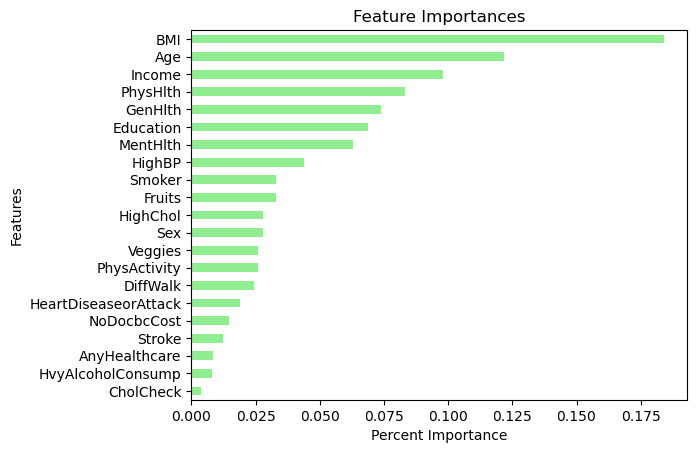

In [40]:
# GRAPHING FEATURE IMPORANTANCES
importances_df = pd.DataFrame(sorted(zip(rf_model.feature_importances_, X.columns), reverse=True))
importances_df.set_index(importances_df[1], inplace=True)
importances_df.drop(columns=1, inplace=True)
importances_df.rename(columns={0: 'Feature Importances'}, inplace=True)
importances_sorted = importances_df.sort_values(by='Feature Importances')
importances_sorted.plot(kind='barh', color='lightgreen', title= 'Feature Importances', xlabel="Percent Importance", ylabel="Features", legend=False)

## Random Forest Model 2 - using only top 10 features

In [41]:
#RandomForest Model 2 
X = di_df.copy()
X.drop(["Diabetes_012","CholCheck","HvyAlcoholConsump","Stroke","NoDocbcCost","AnyHealthcare","HeartDiseaseorAttack","DiffWalk","PhysActivity","Veggies","HighChol","Sex",], axis=1, inplace=True)

y= di_df["Diabetes_012"].values.reshape(-1,1)
y[:5]

array([[0],
       [0],
       [0],
       [0],
       [0]])

In [42]:
#Splitting into Train and Test sets
#Create Standardscaler
#Fitting Standard Scaler
#Scaling Data

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)
scaler = StandardScaler()
X_scaler = scaler.fit(X_train)
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [43]:
# Create a random forest classifier
# Fitting the model

rf_model = RandomForestClassifier(n_estimators=500, random_state=78)
rf_model = rf_model.fit(X_train_scaled, y_train)

# Making predictions using the testing data

predictions = rf_model.predict(X_test_scaled)

C:\Users\leahl\AppData\Local\Temp\ipykernel_13424\1499838181.py:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_model = rf_model.fit(X_train_scaled, y_train)


In [44]:
# Calculating the confusion matrix
# Calculating the accuracy score
# Displaying results

cm2 = confusion_matrix(y_test, predictions)
cm_df2 = pd.DataFrame(
    cm, index=["Actual 0", "Actual 1"], columns=["Predicted 0", "Predicted 1"]
)


acc_score = accuracy_score(y_test, predictions)


print("Confusion Matrix")
display(cm_df2)
print(f"Accuracy Score : {acc_score}")
print("Classification Report")
print(classification_report(y_test, predictions))

Confusion Matrix


,Predicted 0,Predicted 1
Actual 0,51915,1608
Actual 1,7032,1708


Accuracy Score : 0.8483690153060405
Classification Report
              precision    recall  f1-score   support

           0       0.88      0.95      0.92     53523
           1       0.42      0.21      0.28      8740

    accuracy                           0.85     62263
   macro avg       0.65      0.58      0.60     62263
weighted avg       0.82      0.85      0.83     62263



______________________________________________________________________________________________________

## KMeans

In [46]:
# PREPARE THE DATA
dm_df_scaled = StandardScaler().fit_transform(di_df[["BMI", "Age", "HighBP", "Smoker", "PhysHlth", "MentHlth", "GenHlth", "Income", "Education", "Fruits"]])

dm_df_scaled[0:3]

array([[ 1.76844974,  0.32289113,  1.16248967,  1.12302422,  1.24375788,
         2.01084397,  2.33975901, -1.48431015, -1.0732226 , -1.31856281],
       [-0.50633976, -0.33111316, -0.8602227 ,  1.12302422, -0.48415014,
        -0.42814561,  0.46588267, -2.45225139,  0.96059264, -1.31856281],
       [-0.05138186,  0.32289113,  1.16248967, -0.89045275,  2.9716659 ,
         3.63683703,  2.33975901,  0.93554297, -1.0732226 ,  0.75840149]])

In [47]:
dm_df_scaled = pd.DataFrame(
    dm_df_scaled,
    columns=["BMI", "Age", "HighBP", "Smoker", "PhysHlth", "MentHlth", "GenHlth", "Income", "Education", "Fruits"]
)

dm_df_scaled

,BMI,Age,HighBP,Smoker,PhysHlth,MentHlth,GenHlth,Income,Education,Fruits
0,1.768450,0.322891,1.162490,1.123024,1.243758,2.010844,2.339759,-1.484310,-1.073223,-1.318563
1,-0.506340,-0.331113,-0.860223,1.123024,-0.484150,-0.428146,0.465883,-2.452251,0.960593,-1.318563
2,-0.051382,0.322891,1.162490,-0.890453,2.971666,3.636837,2.339759,0.935543,-1.073223,0.758401
3,-0.203034,0.976895,1.162490,-0.890453,-0.484150,-0.428146,-0.471056,-0.032398,-2.090130,0.758401
4,-0.657992,0.976895,1.162490,-0.890453,-0.484150,-0.021647,-0.471056,-1.000340,-0.056315,0.758401
...,...,...,...,...,...,...,...,...,...,...
249044,2.526713,-0.985117,1.162490,-0.890453,0.091819,-0.428146,0.465883,0.451572,0.960593,0.758401
249045,-1.567908,0.976895,1.162490,-0.890453,-0.484150,-0.428146,1.402821,-1.000340,-3.107038,-1.318563
249046,-0.051382,-1.966124,-0.860223,-0.890453,-0.484150,-0.428146,-1.407994,-1.968281,-0.056315,0.758401
249047,-0.809645,-0.331113,1.162490,-0.890453,-0.484150,-0.428146,0.465883,-2.452251,-0.056315,0.758401


In [48]:
model = KMeans(n_clusters=2)
model.fit(dm_df_scaled)
diabetes_clusters = model.predict(dm_df_scaled)

c:\Users\leahl\anaconda3\envs\dev\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [49]:
dm_df_predictions = dm_df_scaled.copy()
dm_df_predictions["DiabetesPrediction"] = diabetes_clusters
dm_df_predictions.head()

,BMI,Age,HighBP,Smoker,PhysHlth,MentHlth,GenHlth,Income,Education,Fruits,DiabetesPrediction
0,1.768450,0.322891,1.162490,1.123024,1.243758,2.010844,2.339759,-1.484310,-1.073223,-1.318563,0
1,-0.506340,-0.331113,-0.860223,1.123024,-0.484150,-0.428146,0.465883,-2.452251,0.960593,-1.318563,0
2,-0.051382,0.322891,1.162490,-0.890453,2.971666,3.636837,2.339759,0.935543,-1.073223,0.758401,0
3,-0.203034,0.976895,1.162490,-0.890453,-0.484150,-0.428146,-0.471056,-0.032398,-2.090130,0.758401,0
4,-0.657992,0.976895,1.162490,-0.890453,-0.484150,-0.021647,-0.471056,-1.000340,-0.056315,0.758401,1


In [54]:
dm_df_actual = di_df.copy()

dm_df_actual["DiabetesPrediction"] = diabetes_clusters
dm_df_actual.head()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,DiabetesPrediction
0,0,1,1,1,40,1,0,0,0,0,...,0,5,18,15,1,0,9,4,3,0
1,0,0,0,0,25,1,0,0,1,0,...,1,3,0,0,0,0,7,6,1,0
2,0,1,1,1,28,0,0,0,0,1,...,1,5,30,30,1,0,9,4,8,0
3,0,1,0,1,27,0,0,0,1,1,...,0,2,0,0,0,0,11,3,6,0
4,0,1,1,1,24,0,0,0,1,1,...,0,2,3,0,0,0,11,5,4,1


In [63]:
og_bmi_age = dm_df_actual.hvplot.scatter(
    x="Age",
    y="BMI",
    by="Diabetes_012",
    title="Diabetes Outcome (Data)"
)

In [64]:
km_bmi_age = dm_df_actual.hvplot.scatter(
    x="Age",
    y="BMI",
    by="DiabetesPrediction",
    title="Diabetes Predictions (KMeans)"
)

In [65]:
(km_bmi_age + og_bmi_age).cols(1)

:Layout
   .NdOverlay.I  :NdOverlay   [DiabetesPrediction]
      :Scatter   [Age]   (BMI)
   .NdOverlay.II :NdOverlay   [Diabetes_012]
      :Scatter   [Age]   (BMI)

In [66]:
og_bmi_income = dm_df_actual.hvplot.scatter(
    x="Income",
    y="BMI",
    by="Diabetes_012",
    title="Diabetes Outcome (Data)"
)

In [67]:
km_bmi_income = dm_df_actual.hvplot.scatter(
    x="Income",
    y="BMI",
    by="DiabetesPrediction",
    title="Diabetes Predictions (KMeans)"
)

In [69]:
(km_bmi_income + og_bmi_income).cols(1)

:Layout
   .NdOverlay.I  :NdOverlay   [DiabetesPrediction]
      :Scatter   [Income]   (BMI)
   .NdOverlay.II :NdOverlay   [Diabetes_012]
      :Scatter   [Income]   (BMI)

In [70]:
og_bmi_phys = dm_df_actual.hvplot.scatter(
    x="PhysHlth",
    y="BMI",
    by="Diabetes_012",
    title="Diabetes Outcome (Data)"
)

In [71]:
km_bmi_phys = dm_df_actual.hvplot.scatter(
    x="PhysHlth",
    y="BMI",
    by="DiabetesPrediction",
    title="Diabetes Predictions (KMeans)"
)

In [72]:
(km_bmi_phys + og_bmi_phys).cols(1)

:Layout
   .NdOverlay.I  :NdOverlay   [DiabetesPrediction]
      :Scatter   [PhysHlth]   (BMI)
   .NdOverlay.II :NdOverlay   [Diabetes_012]
      :Scatter   [PhysHlth]   (BMI)

__________________________________________________________________________________________________________

## Statistics